In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
!pip install mmcv-full -f https://download.openmmlab.com/mmcv/dist/cu111/torch1.10.0/index.html
!git clone https://github.com/open-mmlab/mmsegmentation.git

Looking in links: https://download.openmmlab.com/mmcv/dist/cu111/torch1.10.0/index.html
fatal: destination path 'mmsegmentation' already exists and is not an empty directory.


In [3]:
import torch

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Setup complete. Using torch 1.11.0+cu113 (Tesla P100-PCIE-16GB)


In [4]:
%cd mmsegmentation

/content/mmsegmentation


In [5]:
from mmseg.apis import inference_segmentor, init_segmentor, show_result_pyplot
import mmcv

In [6]:
import os.path as osp
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

In [7]:
!mkdir checkpoints
!wget -O //content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth https://download.openmmlab.com/mmsegmentation/v0.5/segformer/segformer_mit-b5_8x1_1024x1024_160k_cityscapes/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth

mkdir: cannot create directory ‘checkpoints’: File exists
--2022-05-18 01:17:29--  https://download.openmmlab.com/mmsegmentation/v0.5/segformer/segformer_mit-b5_8x1_1024x1024_160k_cityscapes/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 47.88.36.72
Connecting to download.openmmlab.com (download.openmmlab.com)|47.88.36.72|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 328290585 (313M) [application/octet-stream]
Saving to: ‘//content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth’

//content/mmsegment 100%[===================>] 313.08M  14.7MB/s    in 27s     

2022-05-18 01:17:57 (11.6 MB/s) - ‘//content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth’ saved [328290585/328290585]



In [8]:
from mmseg.datasets.builder import DATASETS
from mmseg.datasets.custom import CustomDataset

classes = ('background', 'building', 'road')
palette = [[0, 0, 0], [128, 128, 0], [255, 255, 0]]

@DATASETS.register_module()
class SIADataset(CustomDataset):
  CLASSES = classes
  PALETTE = palette
  def __init__(self, split, **kwargs):
    super().__init__(img_suffix='.png', seg_map_suffix='.png', 
                     split=split, **kwargs)
    assert osp.exists(self.img_dir) and self.split is not None

In [9]:
# config 파일을 설정하고, 다운로드 받은 pretrained 모델을 checkpoint로 설정. 
config_file = '/content/mmsegmentation/configs/segformer/segformer_mit-b5_8x1_1024x1024_160k_cityscapes.py'
checkpoint_file = '/content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth'

from mmcv import Config

cfg = Config.fromfile(config_file)
print(cfg.pretty_text)

norm_cfg = dict(type='SyncBN', requires_grad=True)
model = dict(
    type='EncoderDecoder',
    pretrained=None,
    backbone=dict(
        type='MixVisionTransformer',
        in_channels=3,
        embed_dims=64,
        num_stages=4,
        num_layers=[3, 6, 40, 3],
        num_heads=[1, 2, 5, 8],
        patch_sizes=[7, 3, 3, 3],
        sr_ratios=[8, 4, 2, 1],
        out_indices=(0, 1, 2, 3),
        mlp_ratio=4,
        qkv_bias=True,
        drop_rate=0.0,
        attn_drop_rate=0.0,
        drop_path_rate=0.1,
        init_cfg=dict(type='Pretrained', checkpoint='pretrain/mit_b5.pth')),
    decode_head=dict(
        type='SegformerHead',
        in_channels=[64, 128, 320, 512],
        in_index=[0, 1, 2, 3],
        channels=256,
        dropout_ratio=0.1,
        num_classes=19,
        norm_cfg=dict(type='SyncBN', requires_grad=True),
        align_corners=False,
        loss_decode=dict(
            type='CrossEntropyLoss', use_sigmoid=False, loss_weight=1.0)),
    train_cf

In [10]:
model = dict(
    type='EncoderDecoder',
    pretrained='open-mmlab://resnet101_v1c',
    backbone=dict(
        type='ResNetV1c',
        depth=101,
        num_stages=4,
        out_indices=(0, 1, 2, 3),
        dilations=(1, 1, 1, 1),
        strides=(1, 2, 2, 2),
        norm_cfg=dict(type='BN', requires_grad=True),
        norm_eval=False,
        style='pytorch',
        contract_dilation=True),
    neck=dict(
        type='FPN',
        in_channels=[256, 512, 1024, 2048],
        out_channels=256,
        num_outs=4),
    decode_head=dict(
        type='FPNHead',
        in_channels=[256, 256, 256, 256],
        in_index=[0, 1, 2, 3],
        feature_strides=[4, 8, 16, 32],
        channels=128,
        dropout_ratio=0.1,
        num_classes=19,
        norm_cfg=dict(type='BN', requires_grad=True),
        align_corners=False,
        loss_decode=dict(
            type='CrossEntropyLoss', use_sigmoid=False, loss_weight=1.0)),
    train_cfg=dict(),
    test_cfg=dict(mode='whole'))

In [11]:
img_norm_cfg = dict(
    mean=[123.675, 116.28, 103.53], std=[58.395, 57.12, 57.375], to_rgb=True)
crop_size = (512, 512)
train_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(type='LoadAnnotations'),
    dict(type='Resize', img_scale=(1024, 1024), ratio_range=(0.5, 1.5)),
    dict(type='RandomCrop', crop_size=(512, 512), cat_max_ratio=0.75),
    dict(type='RandomFlip', prob=0.5),
    dict(type='PhotoMetricDistortion'),
    dict(
        type='Normalize',
        mean=[123.675, 116.28, 103.53],
        std=[58.395, 57.12, 57.375],
        to_rgb=True),
    dict(type='Pad', size=(512, 512), pad_val=0, seg_pad_val=255),
    dict(type='DefaultFormatBundle'),
    dict(type='Collect', keys=['img', 'gt_semantic_seg'])
]
test_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(
        type='MultiScaleFlipAug',
        img_scale=(1024, 1024),
        flip=False,
        transforms=[
            dict(type='Resize', keep_ratio=True),
            dict(type='RandomFlip'),
            dict(
                type='Normalize',
                mean=[123.675, 116.28, 103.53],
                std=[58.395, 57.12, 57.375],
                to_rgb=True),
            dict(type='ImageToTensor', keys=['img']),
            dict(type='Collect', keys=['img'])
        ])
]

In [12]:
dataset_type = 'CityscapesDataset'
data_root = 'data/cityscapes/'

data = dict(
    samples_per_gpu=2,  #batch size
    workers_per_gpu=2,  
    train=dict(
        type='CityscapesDataset',
        data_root='data/cityscapes/',
        img_dir='leftImg8bit/train',
        ann_dir='gtFine/train',
        pipeline=[
            dict(type='LoadImageFromFile'),
            dict(type='LoadAnnotations'),
            dict(
                type='Resize', img_scale=(1024, 1024), ratio_range=(0.5, 1.5)),
            dict(type='RandomCrop', crop_size=(512, 512), cat_max_ratio=0.75),
            dict(type='RandomFlip', prob=0.5),
            dict(type='PhotoMetricDistortion'),
            dict(
                type='Normalize',
                mean=[123.675, 116.28, 103.53],
                std=[58.395, 57.12, 57.375],
                to_rgb=True),
            dict(type='Pad', size=(512, 512), pad_val=0, seg_pad_val=255),
            dict(type='DefaultFormatBundle'),
            dict(type='Collect', keys=['img', 'gt_semantic_seg'])
        ]),
    val=dict(
        type='CityscapesDataset',
        data_root='data/cityscapes/',
        img_dir='leftImg8bit/val',
        ann_dir='gtFine/val',
        pipeline=[
            dict(type='LoadImageFromFile'),
            dict(
                type='MultiScaleFlipAug',
                img_scale=(1024, 1024),
                flip=False,
                transforms=[
                    dict(type='Resize', keep_ratio=True),
                    dict(type='RandomFlip'),
                    dict(
                        type='Normalize',
                        mean=[123.675, 116.28, 103.53],
                        std=[58.395, 57.12, 57.375],
                        to_rgb=True),
                    dict(type='ImageToTensor', keys=['img']),
                    dict(type='Collect', keys=['img'])
                ])
        ]),
    test=dict(
        type='CityscapesDataset',
        data_root='data/cityscapes/',
        img_dir='leftImg8bit/val',
        ann_dir='gtFine/val',
        pipeline=[
            dict(type='LoadImageFromFile'),
            dict(
                type='MultiScaleFlipAug',
                img_scale=(1024, 1024),
                flip=False,
                transforms=[
                    dict(type='Resize', keep_ratio=True),
                    dict(type='RandomFlip'),
                    dict(
                        type='Normalize',
                        mean=[123.675, 116.28, 103.53],
                        std=[58.395, 57.12, 57.375],
                        to_rgb=True),
                    dict(type='ImageToTensor', keys=['img']),
                    dict(type='Collect', keys=['img'])
                ])
        ]))

In [13]:
cfg.norm_cfg = dict(type='BN', requires_grad=True)
#cfg.model.backbone.norm_cfg = cfg.norm_cfg
cfg.model.decode_head.norm_cfg = cfg.norm_cfg

cfg.model.decode_head.num_classes = 3

In [14]:
cfg.img_norm_cfg = dict(
    mean=[123.675, 116.28, 103.53], std=[58.395, 57.12, 57.375], to_rgb=True)
cfg.crop_size = (512, 512)
cfg.train_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(type='LoadAnnotations'),
    dict(type='Resize', img_scale=(1024, 1024), ratio_range=(0.5, 1.5)),
    dict(type='RandomCrop', crop_size=cfg.crop_size, cat_max_ratio=0.75),
    dict(type='RandomFlip', flip_ratio=0.5),
    dict(type='PhotoMetricDistortion'),
    dict(type='Normalize', **cfg.img_norm_cfg),
    dict(type='Pad', size=cfg.crop_size, pad_val=0, seg_pad_val=255),
    dict(type='DefaultFormatBundle'),
    dict(type='Collect', keys=['img', 'gt_semantic_seg']),
]

cfg.test_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(
        type='MultiScaleFlipAug',
        img_scale=(1024, 1024),
        # img_ratios=[0.5, 0.75, 1.0, 1.25, 1.5, 1.75],
        flip=False,
        transforms=[
            dict(type='Resize', keep_ratio=True),
            dict(type='RandomFlip'),
            dict(type='Normalize', **cfg.img_norm_cfg),
            dict(type='ImageToTensor', keys=['img']),
            dict(type='Collect', keys=['img']),
        ])
]

In [15]:
cfg.dataset_type = 'SIADataset'
cfg.data_root = '/content/drive/MyDrive/SIA'

cfg.data.train.type = 'SIADataset'
cfg.data.train.data_root = '/content/drive/MyDrive/SIA'
cfg.data.train.img_dir = 'Data_set/road_dataset/img_dir/train'
cfg.data.train.ann_dir = 'Data_set/road_dataset/ann_dir/train'
cfg.data.train.pipeline = cfg.train_pipeline
cfg.data.train.split = '/content/drive/MyDrive/SIA/Data_set/road_dataset/mask_dir/train/up_train_road.txt'

cfg.data.val.type = 'SIADataset'
cfg.data.val.data_root = '/content/drive/MyDrive/SIA'
cfg.data.val.img_dir = 'Data_set/road_dataset/img_dir/train'
cfg.data.val.ann_dir = 'Data_set/road_dataset/ann_dir/train'
cfg.data.val.pipeline = cfg.test_pipeline
cfg.data.val.split = '/content/drive/MyDrive/SIA/Data_set/road_dataset/mask_dir/train/up_val_road.txt'

cfg.data.test.type = 'SIADataset'
cfg.data.test.data_root = '/content/drive/MyDrive/SIA'
cfg.data.test.img_dir = 'Data_set/road_dataset/img_dir/val'
cfg.data.test.ann_dir = 'Data_set/road_dataset/ann_dir/val'
cfg.data.test.pipeline = cfg.test_pipeline
cfg.data.test.split = '/content/drive/MyDrive/SIA/Data_set/road_dataset/mask_dir/val/up.txt'

In [16]:
'''
cfg.data.train.type = 'SIADataset'
cfg.data.train.data_root = '/content/drive/MyDrive/SIA'
cfg.data.train.img_dir = 'images/up025'
cfg.data.train.ann_dir = 'labels'
cfg.data.train.pipeline = cfg.train_pipeline
cfg.data.train.split = '/content/drive/MyDrive/SIA/splits/road/train_road.txt'
'''

"\ncfg.data.train.type = 'SIADataset'\ncfg.data.train.data_root = '/content/drive/MyDrive/SIA'\ncfg.data.train.img_dir = 'images/up025'\ncfg.data.train.ann_dir = 'labels'\ncfg.data.train.pipeline = cfg.train_pipeline\ncfg.data.train.split = '/content/drive/MyDrive/SIA/splits/road/train_road.txt'\n"

In [17]:
cfg.load_from = '/content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth'

# Set up working dir to save files and logs.
cfg.work_dir = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/default'

In [18]:
cfg.runner.max_iteTrs = 200
cfg.log_config.interval = 100
cfg.evaluation.interval = 1000  # 모델 학습시 평가를 몇 번째 iteration마다 할 것인지 지정
cfg.checkpoint_config.interval = 1000  # 모델 학습시 학습한 모델을 몇 번째 iteration마다 저장할 것인지 지정

cfg.runner = dict(type='IterBasedRunner', max_iters=20000)  # Iteration으로 동작, Epoch로 동작하게 변경할 수도 있음
# cfg.runner = dict(type='EpochBasedRunner', max_epochs=4000)  # Epoch로 변경
cfg.workflow = [('train', 1)]

# Set seed to facitate reproducing the result
cfg.seed = 0
#set_random_seed(0, deterministic=False)
cfg.gpu_ids = range(1)

# Let's have a look at the final config used for training
print(f'Config:\n{cfg.pretty_text}')

Config:
norm_cfg = dict(type='BN', requires_grad=True)
model = dict(
    type='EncoderDecoder',
    pretrained=None,
    backbone=dict(
        type='MixVisionTransformer',
        in_channels=3,
        embed_dims=64,
        num_stages=4,
        num_layers=[3, 6, 40, 3],
        num_heads=[1, 2, 5, 8],
        patch_sizes=[7, 3, 3, 3],
        sr_ratios=[8, 4, 2, 1],
        out_indices=(0, 1, 2, 3),
        mlp_ratio=4,
        qkv_bias=True,
        drop_rate=0.0,
        attn_drop_rate=0.0,
        drop_path_rate=0.1,
        init_cfg=dict(type='Pretrained', checkpoint='pretrain/mit_b5.pth')),
    decode_head=dict(
        type='SegformerHead',
        in_channels=[64, 128, 320, 512],
        in_index=[0, 1, 2, 3],
        channels=256,
        dropout_ratio=0.1,
        num_classes=3,
        norm_cfg=dict(type='BN', requires_grad=True),
        align_corners=False,
        loss_decode=dict(
            type='CrossEntropyLoss', use_sigmoid=False, loss_weight=1.0)),
    train_cfg

### 모델 학습

In [19]:
from mmseg.datasets import build_dataset
from mmseg.models import build_segmentor
from mmseg.apis import train_segmentor

# Build the dataset
datasets = [build_dataset(cfg.data.train)]

# Build the detector
model = build_segmentor(
    cfg.model, train_cfg=cfg.get('train_cfg'), test_cfg=cfg.get('test_cfg'))

# Add an attribute for visualization convenience
model.CLASSES = datasets[0].CLASSES

# Create work_dir
mmcv.mkdir_or_exist(osp.abspath(cfg.work_dir))
train_segmentor(model, datasets, cfg, distributed=False, validate=True,
                meta=dict(CLASSES=classes, PALETTE=palette))

2022-05-18 01:17:58,821 - mmseg - INFO - Loaded 542 images
/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '
2022-05-18 01:18:03,011 - mmseg - INFO - Loaded 66 images
2022-05-18 01:18:03,015 - mmseg - INFO - load checkpoint from local path: /content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth
2022-05-18 01:18:03,555 - mmseg - WARNING - The model and loaded state dict do not match exactly

size mismatch for decode_head.conv_seg.weight: copying a param with shape torch.Size([19, 256, 1, 1]) from checkpoint, the shape in current model is torch.Size([3, 256, 1, 1]).
size mismatch for decode_head.conv_seg.bias: copying a param with s

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 0.7 task/s, elapsed: 89s, ETA:     0s

2022-05-18 01:26:12,862 - mmseg - INFO - per class results:
2022-05-18 01:26:12,864 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 89.87 | 96.27 |
|  building  |  nan  |  nan  |
|    road    | 55.34 | 65.36 |
+------------+-------+-------+
2022-05-18 01:26:12,865 - mmseg - INFO - Summary:
2022-05-18 01:26:12,867 - mmseg - INFO - 
+------+-------+-------+
| aAcc |  mIoU |  mAcc |
+------+-------+-------+
| 91.0 | 72.61 | 80.82 |
+------+-------+-------+
2022-05-18 01:26:12,870 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9100, mIoU: 0.7261, mAcc: 0.8082, IoU.background: 0.8987, IoU.building: nan, IoU.road: 0.5534, Acc.background: 0.9627, Acc.building: nan, Acc.road: 0.6536
2022-05-18 01:26:53,914 - mmseg - INFO - Iter [1100/20000]	lr: 4.154e-05, eta: 2:31:51, time: 1.322, data_time: 0.939, memory: 3323, decode.loss_ce: 0.2783, decode.acc_seg: 88.6137, loss: 0.2783
2022-05-18 01:27:32,977 - mmseg - INFO - Iter [120

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 2.9 task/s, elapsed: 23s, ETA:     0s

2022-05-18 01:33:19,786 - mmseg - INFO - per class results:
2022-05-18 01:33:19,788 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.49 | 96.44 |
|  building  |  nan  |  nan  |
|    road    | 58.03 | 68.06 |
+------------+-------+-------+
2022-05-18 01:33:19,790 - mmseg - INFO - Summary:
2022-05-18 01:33:19,792 - mmseg - INFO - 
+------+-------+-------+
| aAcc |  mIoU |  mAcc |
+------+-------+-------+
| 91.6 | 74.26 | 82.25 |
+------+-------+-------+
2022-05-18 01:33:19,794 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9160, mIoU: 0.7426, mAcc: 0.8225, IoU.background: 0.9049, IoU.building: nan, IoU.road: 0.5803, Acc.background: 0.9644, Acc.building: nan, Acc.road: 0.6806
2022-05-18 01:33:59,117 - mmseg - INFO - Iter [2100/20000]	lr: 5.370e-05, eta: 2:15:44, time: 0.639, data_time: 0.252, memory: 3323, decode.loss_ce: 0.2195, decode.acc_seg: 91.2346, loss: 0.2195
2022-05-18 01:34:40,250 - mmseg - INFO - Iter [220

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 2.9 task/s, elapsed: 23s, ETA:     0s

2022-05-18 01:40:23,891 - mmseg - INFO - per class results:
2022-05-18 01:40:23,893 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.63 | 95.37 |
|  building  |  nan  |  nan  |
|    road    | 60.88 | 74.57 |
+------------+-------+-------+
2022-05-18 01:40:23,894 - mmseg - INFO - Summary:
2022-05-18 01:40:23,897 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 91.82 | 75.76 | 84.97 |
+-------+-------+-------+
2022-05-18 01:40:23,899 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9182, mIoU: 0.7576, mAcc: 0.8497, IoU.background: 0.9063, IoU.building: nan, IoU.road: 0.6088, Acc.background: 0.9537, Acc.building: nan, Acc.road: 0.7457
2022-05-18 01:41:03,463 - mmseg - INFO - Iter [3100/20000]	lr: 5.070e-05, eta: 2:05:22, time: 0.624, data_time: 0.235, memory: 3323, decode.loss_ce: 0.2187, decode.acc_seg: 91.1081, loss: 0.2187
2022-05-18 01:41:42,434 - mmseg - INFO - Iter

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 2.9 task/s, elapsed: 23s, ETA:     0s

2022-05-18 01:47:27,884 - mmseg - INFO - per class results:
2022-05-18 01:47:27,886 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background |  90.9 |  96.0 |
|  building  |  nan  |  nan  |
|    road    | 60.88 | 72.72 |
+------------+-------+-------+
2022-05-18 01:47:27,887 - mmseg - INFO - Summary:
2022-05-18 01:47:27,890 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.03 | 75.89 | 84.36 |
+-------+-------+-------+
2022-05-18 01:47:27,892 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9203, mIoU: 0.7589, mAcc: 0.8436, IoU.background: 0.9090, IoU.building: nan, IoU.road: 0.6088, Acc.background: 0.9600, Acc.building: nan, Acc.road: 0.7272
2022-05-18 01:48:07,334 - mmseg - INFO - Iter [4100/20000]	lr: 4.770e-05, eta: 1:56:34, time: 0.621, data_time: 0.234, memory: 3323, decode.loss_ce: 0.1929, decode.acc_seg: 92.0634, loss: 0.1929
2022-05-18 01:48:46,057 - mmseg - INFO - Iter

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 2.9 task/s, elapsed: 23s, ETA:     0s

2022-05-18 01:54:31,105 - mmseg - INFO - per class results:
2022-05-18 01:54:31,107 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.01 | 96.57 |
|  building  |  nan  |  nan  |
|    road    | 60.28 | 70.31 |
+------------+-------+-------+
2022-05-18 01:54:31,109 - mmseg - INFO - Summary:
2022-05-18 01:54:31,111 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.09 | 75.64 | 83.44 |
+-------+-------+-------+
2022-05-18 01:54:31,116 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9209, mIoU: 0.7564, mAcc: 0.8344, IoU.background: 0.9101, IoU.building: nan, IoU.road: 0.6028, Acc.background: 0.9657, Acc.building: nan, Acc.road: 0.7031
2022-05-18 01:55:10,500 - mmseg - INFO - Iter [5100/20000]	lr: 4.470e-05, eta: 1:48:25, time: 0.622, data_time: 0.235, memory: 3323, decode.loss_ce: 0.2018, decode.acc_seg: 91.6403, loss: 0.2018
2022-05-18 01:55:49,368 - mmseg - INFO - Iter

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 2.9 task/s, elapsed: 23s, ETA:     0s

2022-05-18 02:01:33,239 - mmseg - INFO - per class results:
2022-05-18 02:01:33,241 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.21 | 95.65 |
|  building  |  nan  |  nan  |
|    road    | 63.03 | 76.36 |
+------------+-------+-------+
2022-05-18 02:01:33,243 - mmseg - INFO - Summary:
2022-05-18 02:01:33,246 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 92.35 | 77.12 | 86.0 |
+-------+-------+------+
2022-05-18 02:01:33,248 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9235, mIoU: 0.7712, mAcc: 0.8600, IoU.background: 0.9121, IoU.building: nan, IoU.road: 0.6303, Acc.background: 0.9565, Acc.building: nan, Acc.road: 0.7636
2022-05-18 02:02:12,976 - mmseg - INFO - Iter [6100/20000]	lr: 4.170e-05, eta: 1:40:36, time: 0.625, data_time: 0.235, memory: 3323, decode.loss_ce: 0.1772, decode.acc_seg: 92.7440, loss: 0.1772
2022-05-18 02:02:51,956 - mmseg - INFO - Iter [620

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 2.9 task/s, elapsed: 23s, ETA:     0s

2022-05-18 02:08:34,377 - mmseg - INFO - per class results:
2022-05-18 02:08:34,379 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.24 | 96.07 |
|  building  |  nan  |  nan  |
|    road    | 62.37 | 74.28 |
+------------+-------+-------+
2022-05-18 02:08:34,381 - mmseg - INFO - Summary:
2022-05-18 02:08:34,382 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.35 | 76.81 | 85.18 |
+-------+-------+-------+
2022-05-18 02:08:34,384 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9235, mIoU: 0.7681, mAcc: 0.8518, IoU.background: 0.9124, IoU.building: nan, IoU.road: 0.6237, Acc.background: 0.9607, Acc.building: nan, Acc.road: 0.7428
2022-05-18 02:09:15,982 - mmseg - INFO - Iter [7100/20000]	lr: 3.870e-05, eta: 1:33:02, time: 0.643, data_time: 0.255, memory: 3323, decode.loss_ce: 0.1808, decode.acc_seg: 92.4243, loss: 0.1808
2022-05-18 02:09:55,991 - mmseg - INFO - Iter

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 2.8 task/s, elapsed: 23s, ETA:     0s

2022-05-18 02:15:39,009 - mmseg - INFO - per class results:
2022-05-18 02:15:39,010 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.49 | 96.83 |
|  building  |  nan  |  nan  |
|    road    | 62.11 | 71.69 |
+------------+-------+-------+
2022-05-18 02:15:39,011 - mmseg - INFO - Summary:
2022-05-18 02:15:39,013 - mmseg - INFO - 
+-------+------+-------+
|  aAcc | mIoU |  mAcc |
+-------+------+-------+
| 92.53 | 76.8 | 84.26 |
+-------+------+-------+
2022-05-18 02:15:39,015 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9253, mIoU: 0.7680, mAcc: 0.8426, IoU.background: 0.9149, IoU.building: nan, IoU.road: 0.6211, Acc.background: 0.9683, Acc.building: nan, Acc.road: 0.7169
2022-05-18 02:16:18,654 - mmseg - INFO - Iter [8100/20000]	lr: 3.570e-05, eta: 1:25:34, time: 0.630, data_time: 0.241, memory: 3323, decode.loss_ce: 0.1788, decode.acc_seg: 92.4969, loss: 0.1788
2022-05-18 02:16:59,713 - mmseg - INFO - Iter [820

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 2.8 task/s, elapsed: 24s, ETA:     0s

2022-05-18 02:22:42,754 - mmseg - INFO - per class results:
2022-05-18 02:22:42,755 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background |  91.4 | 96.09 |
|  building  |  nan  |  nan  |
|    road    | 63.07 | 75.05 |
+------------+-------+-------+
2022-05-18 02:22:42,757 - mmseg - INFO - Summary:
2022-05-18 02:22:42,762 - mmseg - INFO - 
+------+-------+-------+
| aAcc |  mIoU |  mAcc |
+------+-------+-------+
| 92.5 | 77.23 | 85.57 |
+------+-------+-------+
2022-05-18 02:22:42,764 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9250, mIoU: 0.7723, mAcc: 0.8557, IoU.background: 0.9140, IoU.building: nan, IoU.road: 0.6307, Acc.background: 0.9609, Acc.building: nan, Acc.road: 0.7505
2022-05-18 02:23:22,395 - mmseg - INFO - Iter [9100/20000]	lr: 3.270e-05, eta: 1:18:13, time: 0.633, data_time: 0.243, memory: 3323, decode.loss_ce: 0.1552, decode.acc_seg: 93.4971, loss: 0.1552
2022-05-18 02:24:01,394 - mmseg - INFO - Iter [920

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 2.8 task/s, elapsed: 24s, ETA:     0s

2022-05-18 02:29:47,105 - mmseg - INFO - per class results:
2022-05-18 02:29:47,107 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background |  91.6 | 96.72 |
|  building  |  nan  |  nan  |
|    road    | 62.82 | 72.83 |
+------------+-------+-------+
2022-05-18 02:29:47,108 - mmseg - INFO - Summary:
2022-05-18 02:29:47,111 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.64 | 77.21 | 84.78 |
+-------+-------+-------+
2022-05-18 02:29:47,114 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9264, mIoU: 0.7721, mAcc: 0.8478, IoU.background: 0.9160, IoU.building: nan, IoU.road: 0.6282, Acc.background: 0.9672, Acc.building: nan, Acc.road: 0.7283
2022-05-18 02:30:26,506 - mmseg - INFO - Iter [10100/20000]	lr: 2.970e-05, eta: 1:10:56, time: 0.630, data_time: 0.243, memory: 3323, decode.loss_ce: 0.1625, decode.acc_seg: 93.2103, loss: 0.1625
2022-05-18 02:31:05,318 - mmseg - INFO - Ite

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 2.8 task/s, elapsed: 23s, ETA:     0s

2022-05-18 02:36:50,663 - mmseg - INFO - per class results:
2022-05-18 02:36:50,665 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.29 | 95.69 |
|  building  |  nan  |  nan  |
|    road    | 63.31 | 76.55 |
+------------+-------+-------+
2022-05-18 02:36:50,666 - mmseg - INFO - Summary:
2022-05-18 02:36:50,668 - mmseg - INFO - 
+-------+------+-------+
|  aAcc | mIoU |  mAcc |
+-------+------+-------+
| 92.43 | 77.3 | 86.12 |
+-------+------+-------+
2022-05-18 02:36:50,671 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9243, mIoU: 0.7730, mAcc: 0.8612, IoU.background: 0.9129, IoU.building: nan, IoU.road: 0.6331, Acc.background: 0.9569, Acc.building: nan, Acc.road: 0.7655
2022-05-18 02:37:30,188 - mmseg - INFO - Iter [11100/20000]	lr: 2.670e-05, eta: 1:03:41, time: 0.628, data_time: 0.239, memory: 3323, decode.loss_ce: 0.1631, decode.acc_seg: 93.1041, loss: 0.1631
2022-05-18 02:38:09,093 - mmseg - INFO - Iter [11

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 2.8 task/s, elapsed: 24s, ETA:     0s

2022-05-18 02:43:54,688 - mmseg - INFO - per class results:
2022-05-18 02:43:54,690 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.71 | 97.03 |
|  building  |  nan  |  nan  |
|    road    | 62.75 |  71.8 |
+------------+-------+-------+
2022-05-18 02:43:54,691 - mmseg - INFO - Summary:
2022-05-18 02:43:54,693 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.72 | 77.23 | 84.41 |
+-------+-------+-------+
2022-05-18 02:43:54,696 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9272, mIoU: 0.7723, mAcc: 0.8441, IoU.background: 0.9171, IoU.building: nan, IoU.road: 0.6275, Acc.background: 0.9703, Acc.building: nan, Acc.road: 0.7180
2022-05-18 02:44:34,015 - mmseg - INFO - Iter [12100/20000]	lr: 2.370e-05, eta: 0:56:28, time: 0.630, data_time: 0.244, memory: 3323, decode.loss_ce: 0.1550, decode.acc_seg: 93.4870, loss: 0.1550
2022-05-18 02:45:12,979 - mmseg - INFO - Ite

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 2.8 task/s, elapsed: 24s, ETA:     0s

2022-05-18 02:50:57,320 - mmseg - INFO - per class results:
2022-05-18 02:50:57,322 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.44 | 96.51 |
|  building  |  nan  |  nan  |
|    road    | 62.47 | 73.07 |
+------------+-------+-------+
2022-05-18 02:50:57,323 - mmseg - INFO - Summary:
2022-05-18 02:50:57,326 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.51 | 76.96 | 84.79 |
+-------+-------+-------+
2022-05-18 02:50:57,328 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9251, mIoU: 0.7696, mAcc: 0.8479, IoU.background: 0.9144, IoU.building: nan, IoU.road: 0.6247, Acc.background: 0.9651, Acc.building: nan, Acc.road: 0.7307
2022-05-18 02:51:38,607 - mmseg - INFO - Iter [13100/20000]	lr: 2.070e-05, eta: 0:49:17, time: 0.653, data_time: 0.268, memory: 3323, decode.loss_ce: 0.1327, decode.acc_seg: 94.4707, loss: 0.1327
2022-05-18 02:52:17,394 - mmseg - INFO - Ite

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 2.8 task/s, elapsed: 24s, ETA:     0s

2022-05-18 02:58:02,416 - mmseg - INFO - per class results:
2022-05-18 02:58:02,418 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.64 | 96.43 |
|  building  |  nan  |  nan  |
|    road    |  63.6 | 74.64 |
+------------+-------+-------+
2022-05-18 02:58:02,419 - mmseg - INFO - Summary:
2022-05-18 02:58:02,421 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.71 | 77.62 | 85.53 |
+-------+-------+-------+
2022-05-18 02:58:02,424 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9271, mIoU: 0.7762, mAcc: 0.8553, IoU.background: 0.9164, IoU.building: nan, IoU.road: 0.6360, Acc.background: 0.9643, Acc.building: nan, Acc.road: 0.7464
2022-05-18 02:58:43,623 - mmseg - INFO - Iter [14100/20000]	lr: 1.770e-05, eta: 0:42:07, time: 0.650, data_time: 0.266, memory: 3323, decode.loss_ce: 0.1431, decode.acc_seg: 93.8816, loss: 0.1431
2022-05-18 02:59:22,542 - mmseg - INFO - Ite

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 2.7 task/s, elapsed: 24s, ETA:     0s

2022-05-18 03:05:06,887 - mmseg - INFO - per class results:
2022-05-18 03:05:06,889 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.69 | 96.76 |
|  building  |  nan  |  nan  |
|    road    | 63.18 | 73.13 |
+------------+-------+-------+
2022-05-18 03:05:06,892 - mmseg - INFO - Summary:
2022-05-18 03:05:06,894 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.73 | 77.44 | 84.95 |
+-------+-------+-------+
2022-05-18 03:05:06,898 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9273, mIoU: 0.7744, mAcc: 0.8495, IoU.background: 0.9169, IoU.building: nan, IoU.road: 0.6318, Acc.background: 0.9676, Acc.building: nan, Acc.road: 0.7313
2022-05-18 03:05:46,156 - mmseg - INFO - Iter [15100/20000]	lr: 1.470e-05, eta: 0:34:57, time: 0.634, data_time: 0.249, memory: 3323, decode.loss_ce: 0.1432, decode.acc_seg: 93.9997, loss: 0.1432
2022-05-18 03:06:27,174 - mmseg - INFO - Ite

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 2.7 task/s, elapsed: 24s, ETA:     0s

2022-05-18 03:12:11,958 - mmseg - INFO - per class results:
2022-05-18 03:12:11,960 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.75 | 96.65 |
|  building  |  nan  |  nan  |
|    road    | 63.66 | 74.02 |
+------------+-------+-------+
2022-05-18 03:12:11,962 - mmseg - INFO - Summary:
2022-05-18 03:12:11,965 - mmseg - INFO - 
+-------+------+-------+
|  aAcc | mIoU |  mAcc |
+-------+------+-------+
| 92.79 | 77.7 | 85.34 |
+-------+------+-------+
2022-05-18 03:12:11,967 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9279, mIoU: 0.7770, mAcc: 0.8534, IoU.background: 0.9175, IoU.building: nan, IoU.road: 0.6366, Acc.background: 0.9665, Acc.building: nan, Acc.road: 0.7402
2022-05-18 03:12:51,376 - mmseg - INFO - Iter [16100/20000]	lr: 1.170e-05, eta: 0:27:48, time: 0.636, data_time: 0.249, memory: 3323, decode.loss_ce: 0.1425, decode.acc_seg: 93.9949, loss: 0.1425
2022-05-18 03:13:30,479 - mmseg - INFO - Iter [16

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 2.7 task/s, elapsed: 24s, ETA:     0s

2022-05-18 03:19:16,461 - mmseg - INFO - per class results:
2022-05-18 03:19:16,463 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.65 | 96.54 |
|  building  |  nan  |  nan  |
|    road    |  63.4 | 74.06 |
+------------+-------+-------+
2022-05-18 03:19:16,465 - mmseg - INFO - Summary:
2022-05-18 03:19:16,468 - mmseg - INFO - 
+------+-------+------+
| aAcc |  mIoU | mAcc |
+------+-------+------+
| 92.7 | 77.52 | 85.3 |
+------+-------+------+
2022-05-18 03:19:16,471 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9270, mIoU: 0.7752, mAcc: 0.8530, IoU.background: 0.9165, IoU.building: nan, IoU.road: 0.6340, Acc.background: 0.9654, Acc.building: nan, Acc.road: 0.7406
2022-05-18 03:19:55,708 - mmseg - INFO - Iter [17100/20000]	lr: 8.703e-06, eta: 0:20:40, time: 0.633, data_time: 0.247, memory: 3323, decode.loss_ce: 0.1246, decode.acc_seg: 94.7225, loss: 0.1246
2022-05-18 03:20:34,804 - mmseg - INFO - Iter [17200/2

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 2.7 task/s, elapsed: 24s, ETA:     0s

2022-05-18 03:26:20,416 - mmseg - INFO - per class results:
2022-05-18 03:26:20,418 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.71 |  96.7 |
|  building  |  nan  |  nan  |
|    road    | 63.39 | 73.55 |
+------------+-------+-------+
2022-05-18 03:26:20,422 - mmseg - INFO - Summary:
2022-05-18 03:26:20,423 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.75 | 77.55 | 85.12 |
+-------+-------+-------+
2022-05-18 03:26:20,426 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9275, mIoU: 0.7755, mAcc: 0.8512, IoU.background: 0.9171, IoU.building: nan, IoU.road: 0.6339, Acc.background: 0.9670, Acc.building: nan, Acc.road: 0.7355
2022-05-18 03:26:59,277 - mmseg - INFO - Iter [18100/20000]	lr: 5.703e-06, eta: 0:13:32, time: 0.630, data_time: 0.248, memory: 3323, decode.loss_ce: 0.1389, decode.acc_seg: 94.0758, loss: 0.1389
2022-05-18 03:27:37,974 - mmseg - INFO - Ite

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 2.8 task/s, elapsed: 23s, ETA:     0s

2022-05-18 03:33:21,558 - mmseg - INFO - per class results:
2022-05-18 03:33:21,559 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.73 | 96.44 |
|  building  |  nan  |  nan  |
|    road    | 63.96 | 75.03 |
+------------+-------+-------+
2022-05-18 03:33:21,561 - mmseg - INFO - Summary:
2022-05-18 03:33:21,563 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.79 | 77.85 | 85.73 |
+-------+-------+-------+
2022-05-18 03:33:21,565 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9279, mIoU: 0.7785, mAcc: 0.8573, IoU.background: 0.9173, IoU.building: nan, IoU.road: 0.6396, Acc.background: 0.9644, Acc.building: nan, Acc.road: 0.7503
2022-05-18 03:34:00,623 - mmseg - INFO - Iter [19100/20000]	lr: 2.703e-06, eta: 0:06:24, time: 0.624, data_time: 0.240, memory: 3323, decode.loss_ce: 0.1407, decode.acc_seg: 93.9645, loss: 0.1407
2022-05-18 03:34:39,400 - mmseg - INFO - Ite

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 66/66, 2.8 task/s, elapsed: 24s, ETA:     0s

2022-05-18 03:40:21,546 - mmseg - INFO - per class results:
2022-05-18 03:40:21,548 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.75 |  96.5 |
|  building  |  nan  |  nan  |
|    road    | 63.95 | 74.82 |
+------------+-------+-------+
2022-05-18 03:40:21,552 - mmseg - INFO - Summary:
2022-05-18 03:40:21,553 - mmseg - INFO - 
+------+-------+-------+
| aAcc |  mIoU |  mAcc |
+------+-------+-------+
| 92.8 | 77.85 | 85.66 |
+------+-------+-------+
2022-05-18 03:40:21,555 - mmseg - INFO - Iter(val) [66]	aAcc: 0.9280, mIoU: 0.7785, mAcc: 0.8566, IoU.background: 0.9175, IoU.building: nan, IoU.road: 0.6395, Acc.background: 0.9650, Acc.building: nan, Acc.road: 0.7482


### 모델 결과 시각화

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/default/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


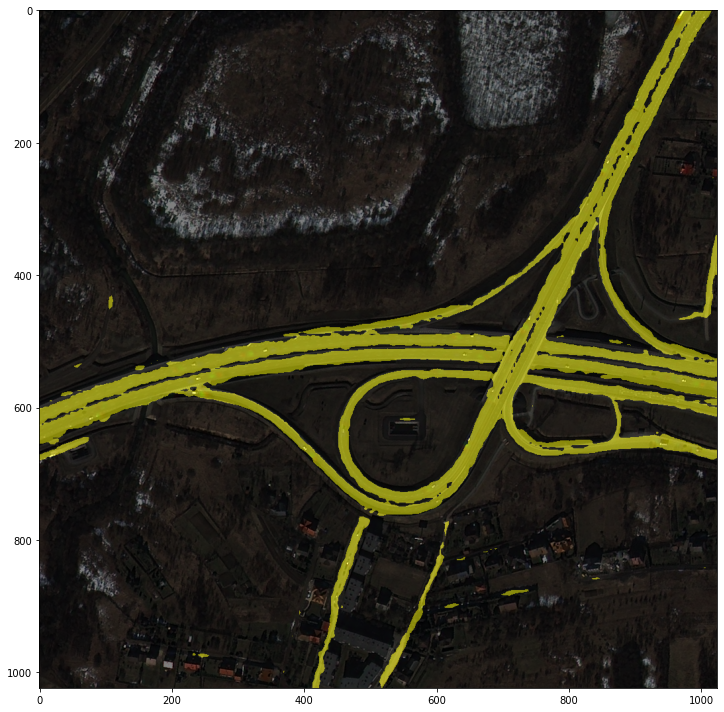

In [21]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/default/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/images/up025/OBJ00175_PS3_K3_NIA0081.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/default/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


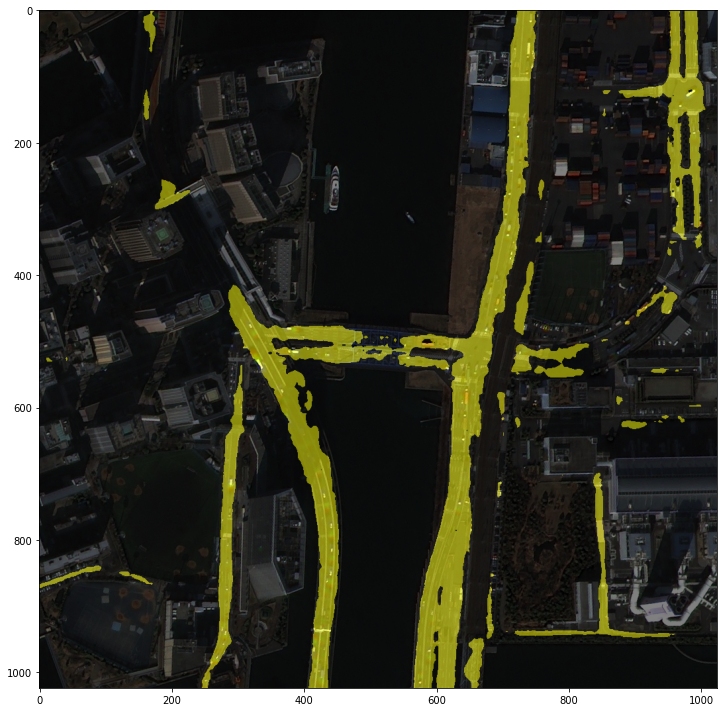

In [22]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/default/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/images/up025/OBJ00004_PS3_K3_NIA0078.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/default/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


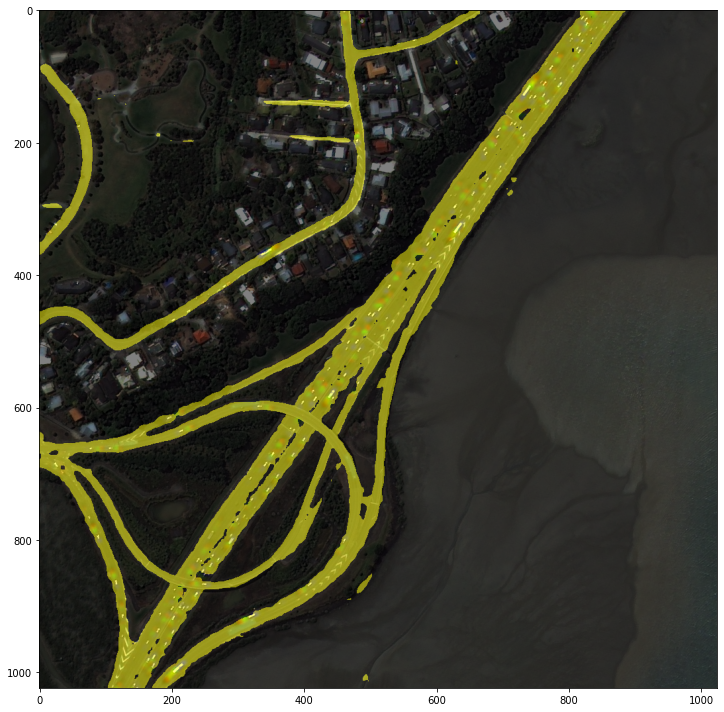

In [23]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/default/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/images/up025/OBJ01403_PS3_K3_NIA0093.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/default/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


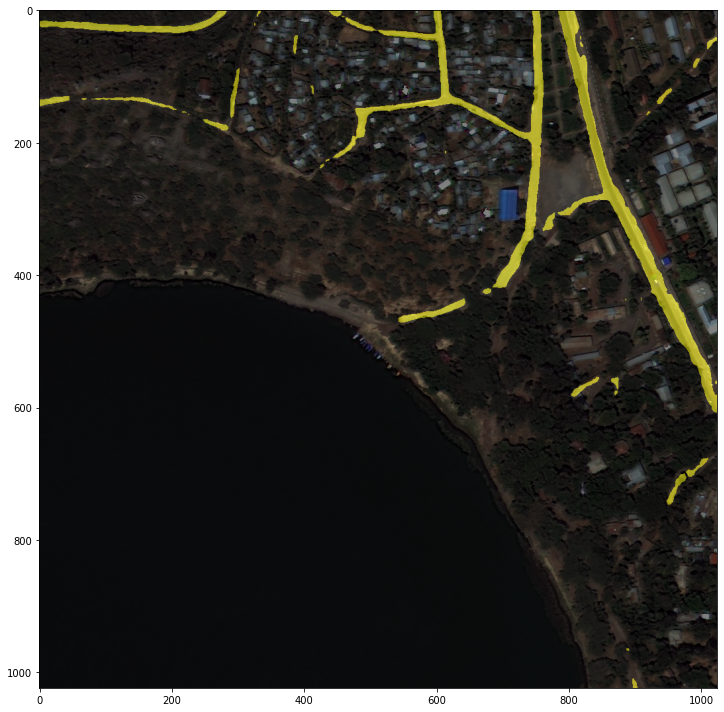

In [24]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/default/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/images/up025/OBJ02447_PS3_K3_NIA0122.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/default/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


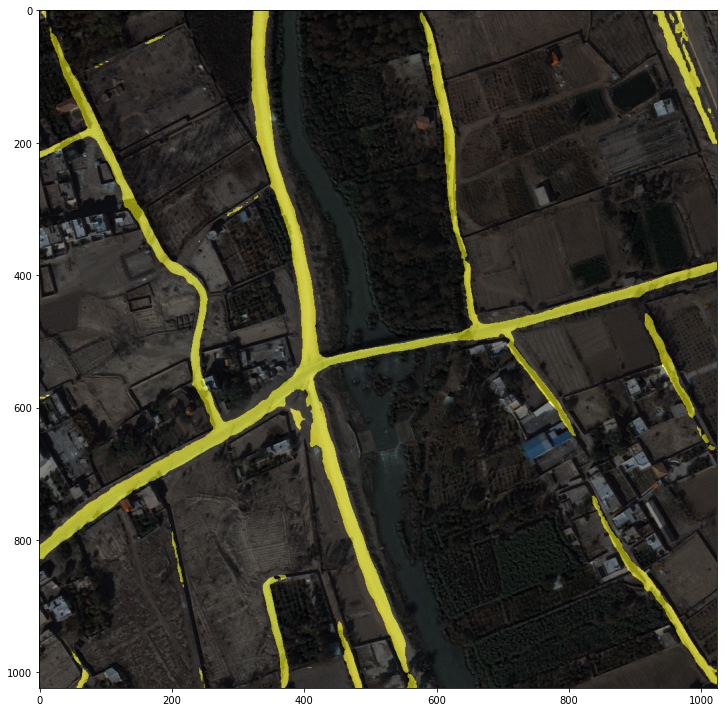

In [25]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/default/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/images/up025/OBJ03325_PS3_K3A_NIA0137.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/default/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


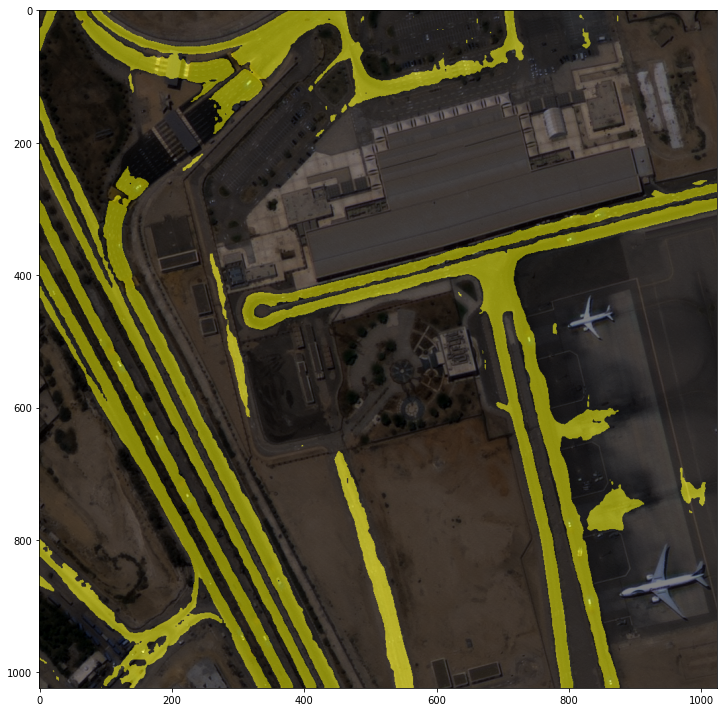

In [26]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/default/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/images/up025/BLD00768_PS3_K3A_NIA0277.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/default/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


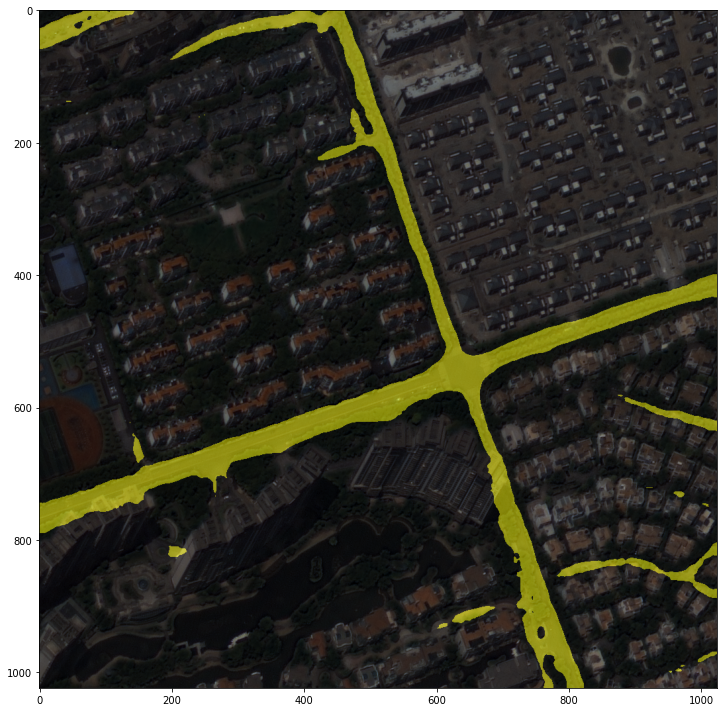

In [27]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/default/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/images/up025/BLD01556_PS3_K3A_NIA0373.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/default/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


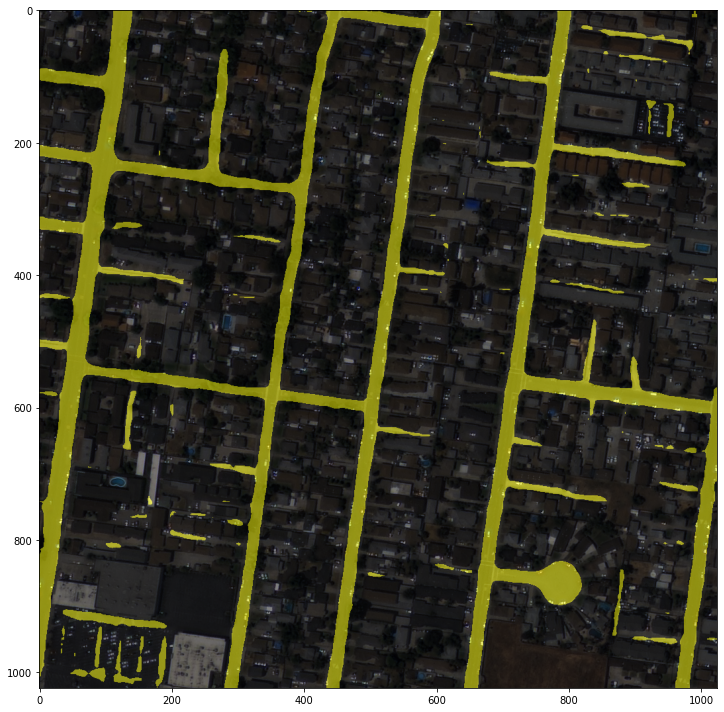

In [28]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/default/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/images/up025/BLD11632_PS3_K3A_NIA0390.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/default/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


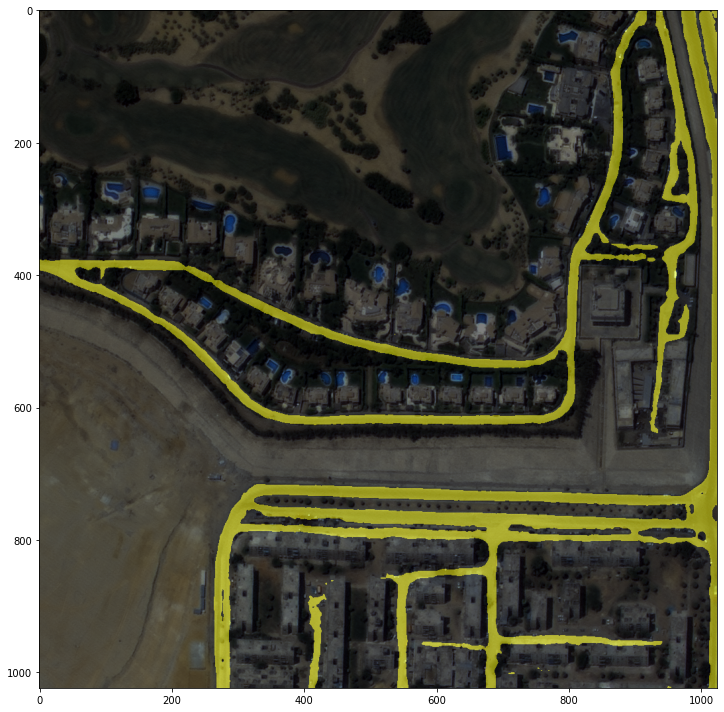

In [29]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/default/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/images/up025/BLD00223_PS3_K3A_NIA0276.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/default/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


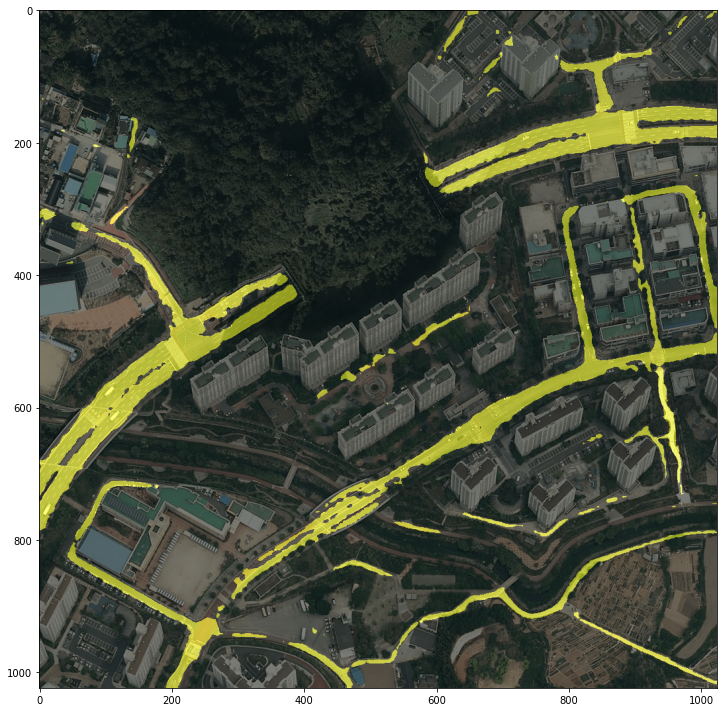

In [30]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/default/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/naver_map_images/0000.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/default/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


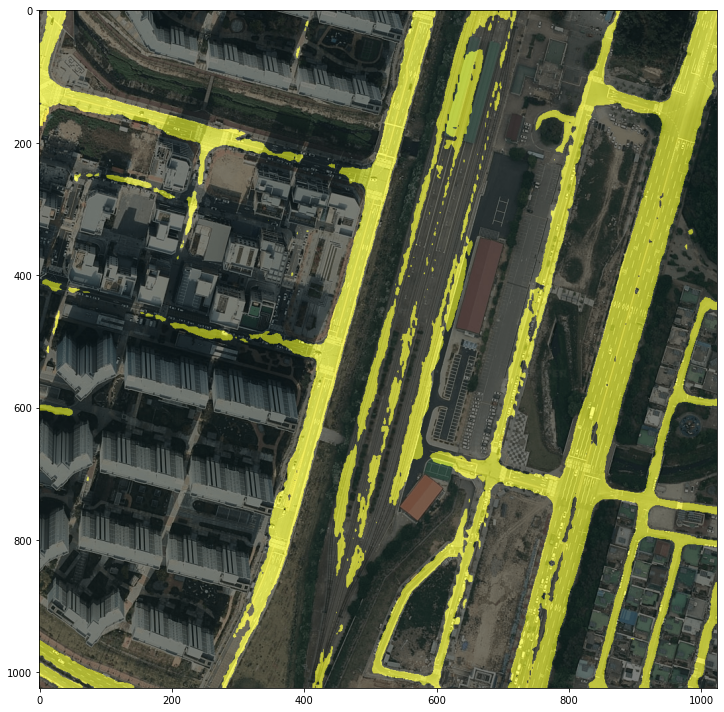

In [31]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/default/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/naver_map_images/0001.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/default/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


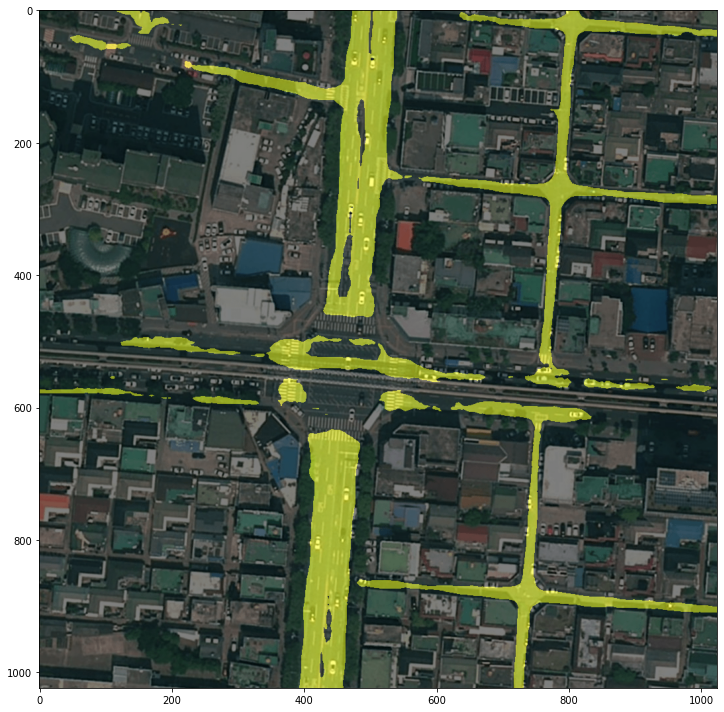

In [32]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/road/default/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/naver_map_images/0002.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)